In [1]:
from google.colab import drive
drive.mount("/content/MyDrive")

Mounted at /content/MyDrive


In [2]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from scipy.stats import zscore
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn import svm
from scipy.spatial.distance import cdist
from scipy.cluster.hierarchy import linkage,cophenet,dendrogram
from scipy.spatial.distance import pdist 
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.decomposition import PCA

#PartA

In [3]:
df1=pd.read_csv('/content/MyDrive/MyDrive/Dataset/Car name.csv')
df2=pd.read_json('/content/MyDrive/MyDrive/Dataset/Car-Attributes.json')

In [4]:
df1.head()  #Showing the first 5 datapoints

,car_name
0,chevrolet chevelle malibu
1,buick skylark 320
2,plymouth satellite
3,amc rebel sst
4,ford torino


In [5]:
df1.shape #checking the no of rows and columns in dataset

(398, 1)

In [6]:
df2.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,18.0,8,307.0,130,3504,12.0,70,1
1,15.0,8,350.0,165,3693,11.5,70,1
2,18.0,8,318.0,150,3436,11.0,70,1
3,16.0,8,304.0,150,3433,12.0,70,1
4,17.0,8,302.0,140,3449,10.5,70,1


In [7]:
df2.shape

(398, 8)

In [8]:
df=df1.join(df2,how='left') #Joining the two dataframes 
df.head()

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130,3504,12.0,70,1
1,buick skylark 320,15.0,8,350.0,165,3693,11.5,70,1
2,plymouth satellite,18.0,8,318.0,150,3436,11.0,70,1
3,amc rebel sst,16.0,8,304.0,150,3433,12.0,70,1
4,ford torino,17.0,8,302.0,140,3449,10.5,70,1


In [9]:
df.shape

(398, 9)

In [10]:
df.info() #info of the complete dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   car_name  398 non-null    object 
 1   mpg       398 non-null    float64
 2   cyl       398 non-null    int64  
 3   disp      398 non-null    float64
 4   hp        398 non-null    object 
 5   wt        398 non-null    int64  
 6   acc       398 non-null    float64
 7   yr        398 non-null    int64  
 8   origin    398 non-null    int64  
dtypes: float64(3), int64(4), object(2)
memory usage: 28.1+ KB


In [11]:
df.isnull().sum() #check for null values

car_name    0
mpg         0
cyl         0
disp        0
hp          0
wt          0
acc         0
yr          0
origin      0
dtype: int64

In [12]:
for value in df.columns:
    print(value,":", np.sum(df[value]=="?")) #check for question mark

car_name : 0
mpg : 0
cyl : 0
disp : 0
hp : 6
wt : 0
acc : 0
yr : 0
origin : 0


In [13]:
df3=df.copy(deep=True )

In [14]:
df3.replace( to_replace="?",value=np.nan,inplace=True) 
df3.isnull().sum()

car_name    0
mpg         0
cyl         0
disp        0
hp          6
wt          0
acc         0
yr          0
origin      0
dtype: int64

In [15]:
df3.drop(axis=1, columns='car_name', inplace=True) 

In [16]:
df3.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,18.0,8,307.0,130.0,3504,12.0,70,1
1,15.0,8,350.0,165.0,3693,11.5,70,1
2,18.0,8,318.0,150.0,3436,11.0,70,1
3,16.0,8,304.0,150.0,3433,12.0,70,1
4,17.0,8,302.0,140.0,3449,10.5,70,1


In [17]:
median_filler= lambda x: x.fillna(x.median())      #imputing the missing values
df3=df3.apply(median_filler,axis=0) 

In [18]:
df3.duplicated().sum()

0

In [19]:
df3.describe()    #statistical summary

,mpg,cyl,disp,hp,wt,acc,yr,origin
count,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000
mean,23.514573,5.454774,193.425879,104.304020,2970.424623,15.568090,76.010050,1.572864
std,7.815984,1.701004,104.269838,38.222625,846.841774,2.757689,3.697627,0.802055
min,9.000000,3.000000,68.000000,46.000000,1613.000000,8.000000,70.000000,1.000000
25%,17.500000,4.000000,104.250000,76.000000,2223.750000,13.825000,73.000000,1.000000
50%,23.000000,4.000000,148.500000,93.500000,2803.500000,15.500000,76.000000,1.000000
75%,29.000000,8.000000,262.000000,125.000000,3608.000000,17.175000,79.000000,2.000000
max,46.600000,8.000000,455.000000,230.000000,5140.000000,24.800000,82.000000,3.000000


Text(0.5, 1.0, 'acc')

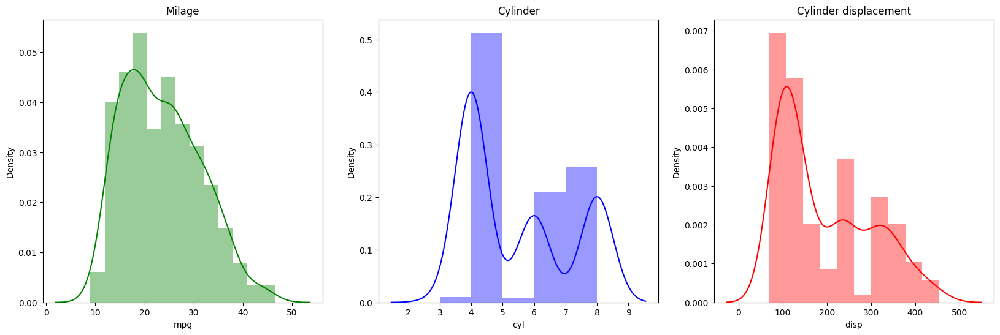

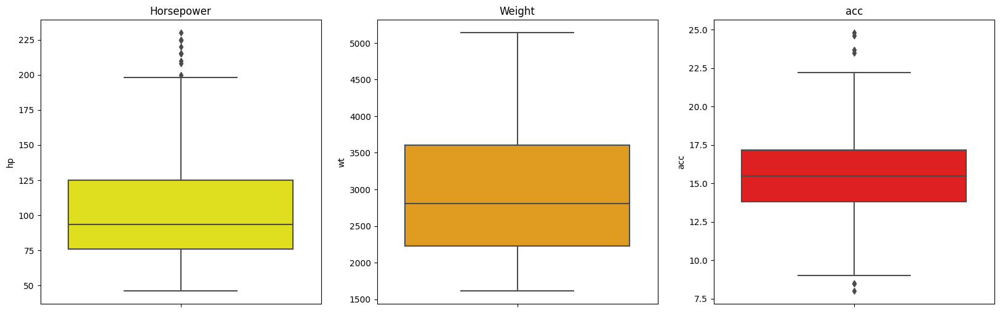

In [20]:
import warnings
warnings.filterwarnings('ignore')

plt.figure(figsize=(20,6));

plt.subplot(1,3,1);
sns.distplot(df3['mpg'],color='green');
plt.title('Milage')

plt.subplot(1,3,2);
sns.distplot(df3['cyl'],color='blue');
plt.title('Cylinder')

plt.subplot(1,3,3);
sns.distplot(df3['disp'],color='red');
plt.title('Cylinder displacement')

plt.figure(figsize=(20,6));

plt.subplot(1,3,1);
sns.boxplot(y=df3['hp'],color='yellow');
plt.title('Horsepower')

plt.subplot(1,3,2);
sns.boxplot(y=df3['wt'],color='orange');
plt.title('Weight')

plt.subplot(1,3,3);
sns.boxplot(y=df3['acc'],color='red');
plt.title('acc')

Milage tends to follow a normal distribution whilst other attributes are not. Horsepower and Acc has a few outliers

Text(0.5, 1.0, 'Cylinder displacement')

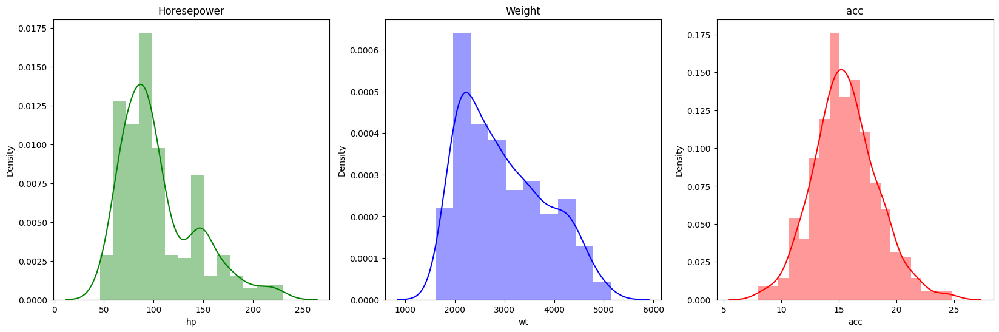

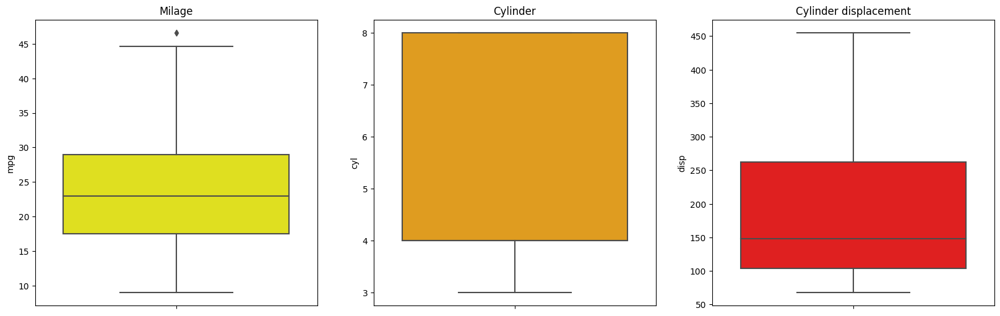

In [21]:
plt.figure(figsize=(20,6));

plt.subplot(1,3,1);
sns.distplot(df3['hp'],color='green');
plt.title('Horesepower')

plt.subplot(1,3,2);
sns.distplot(df3['wt'],color='blue');
plt.title('Weight')

plt.subplot(1,3,3);
sns.distplot(df3['acc'],color='red');
plt.title('acc')

plt.figure(figsize=(20,6));

plt.subplot(1,3,1);
sns.boxplot(y=df3['mpg'],color='yellow');
plt.title('Milage')

plt.subplot(1,3,2);
sns.boxplot(y=df3['cyl'],color='orange');
plt.title('Cylinder')

plt.subplot(1,3,3);
sns.boxplot(y=df3['disp'],color='red');
plt.title('Cylinder displacement')

Acc follows a normal distribution whereas the horsepower and weight variables are slightly skewed. There are no much outliers in the five point summary.

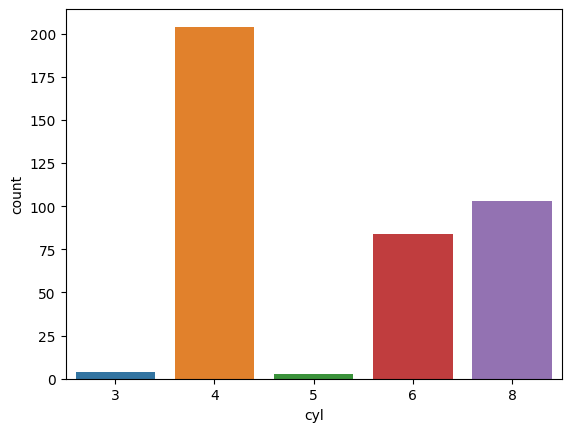

In [22]:
sns.countplot(data=df3,x='cyl');

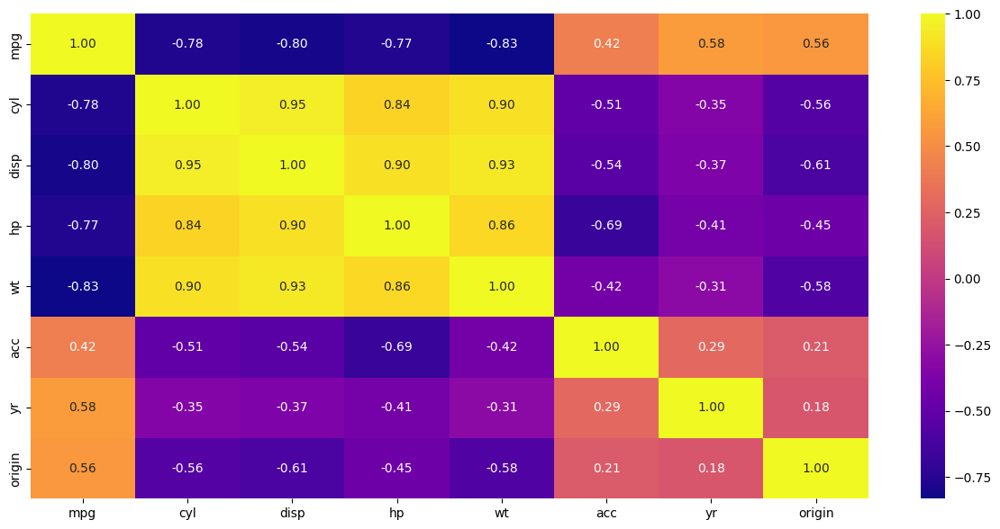

In [23]:
plt.figure(figsize = (15,7))
sns.heatmap(df3.corr(), cmap='plasma',annot=True, fmt='.2f'); 

Strong and weak correlations can be spotted among various attributes. Highest correlation can be seen between hp and cyl.

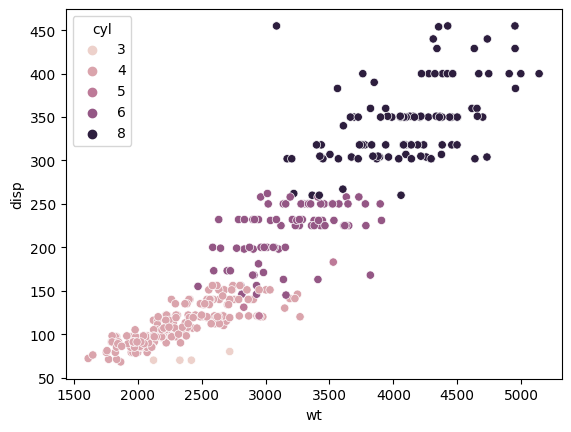

In [24]:
sns.scatterplot(data=df3,x='wt',y='disp',hue='cyl');

More the no. of cylinders, higher the weight and cylinder displacement.

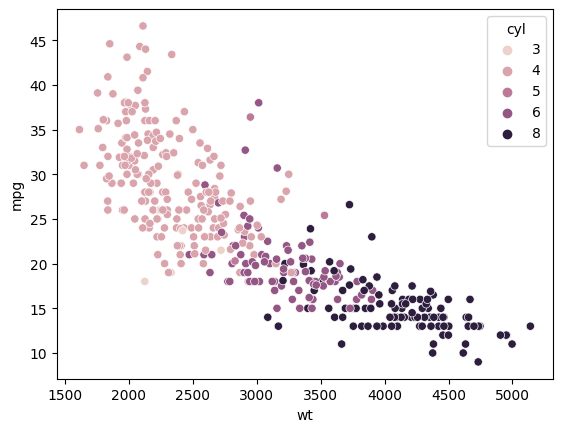

In [25]:
sns.scatterplot(data=df3,x='wt',y='mpg',hue='cyl');

As the no of cylinders are more, weight is more but milage is reducing.

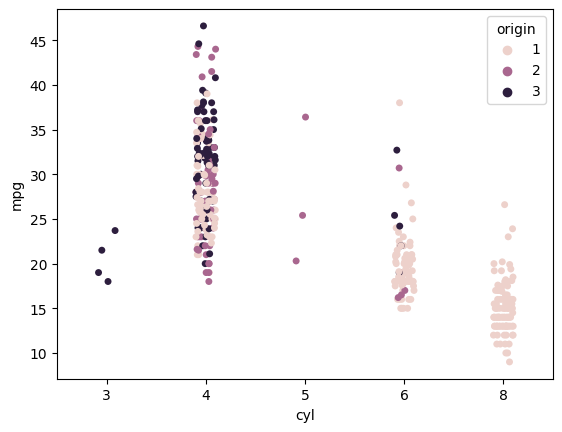

In [26]:
sns.stripplot(data=df3,x='cyl',y='mpg',hue='origin');

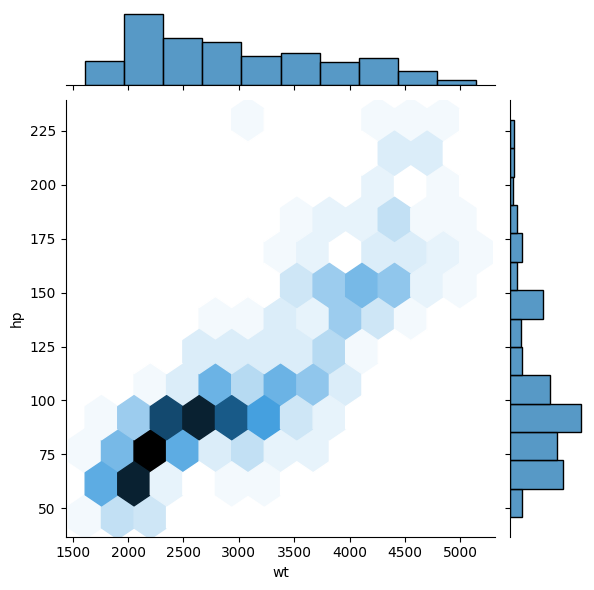

In [27]:
sns.jointplot(data=df3,x='wt',y='hp',kind='hex');

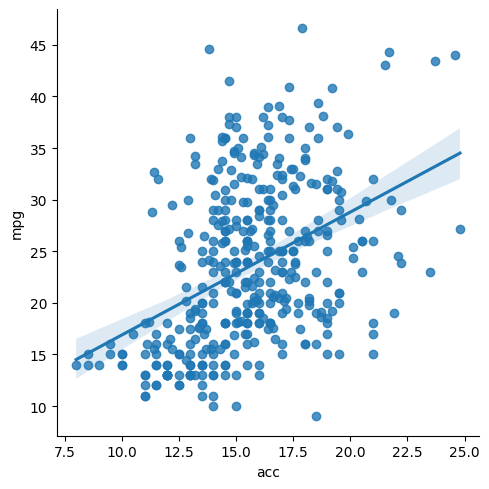

In [28]:
sns.lmplot(data=df3,x='acc',y='mpg');

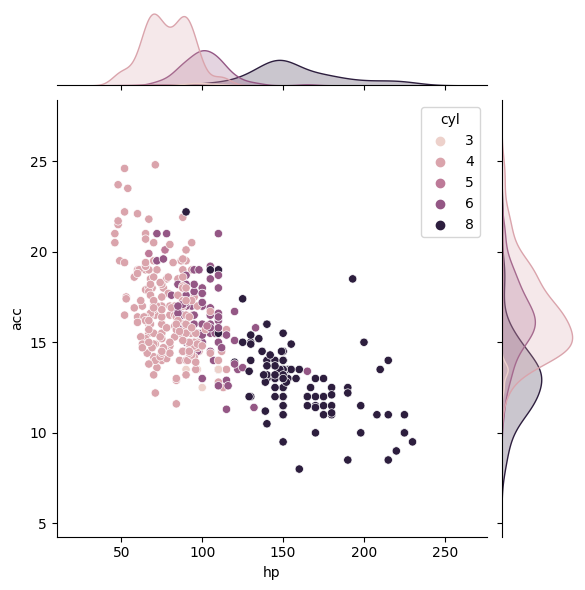

In [29]:
sns.jointplot(data=df3,x='hp',y='acc',hue='cyl');

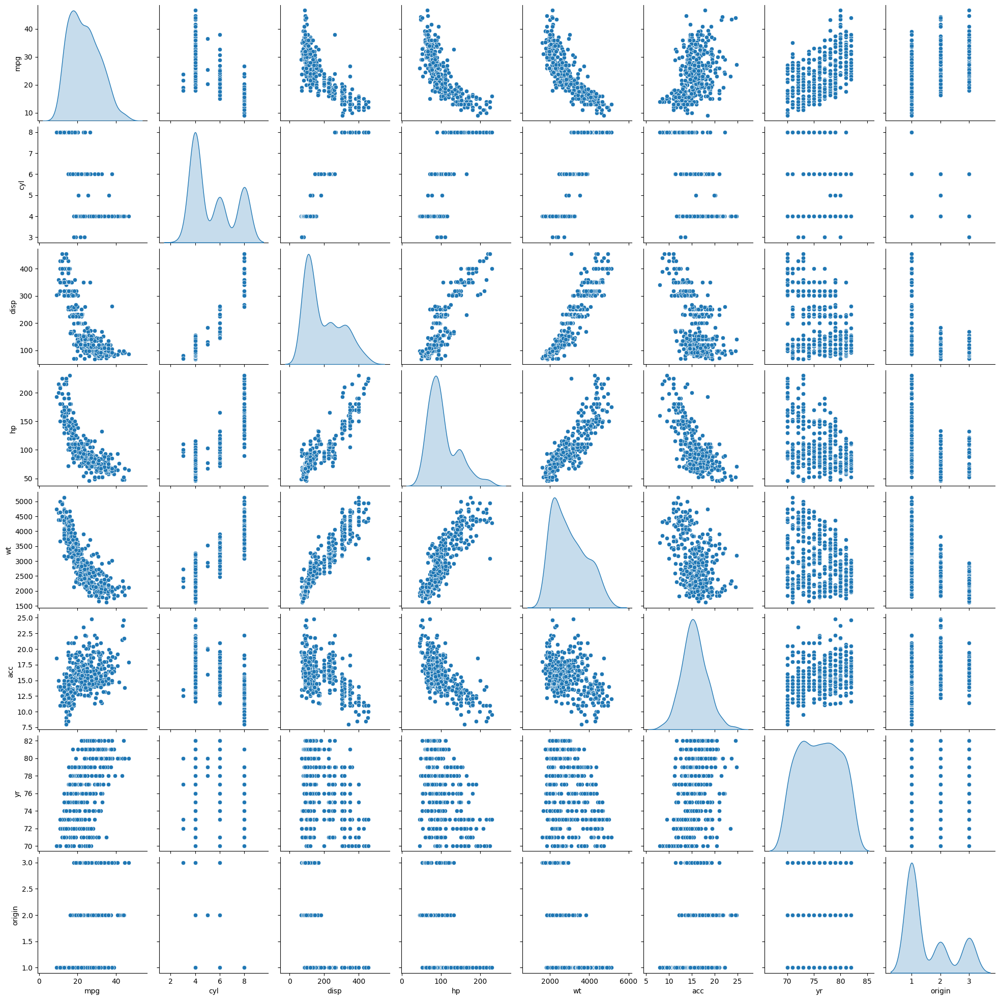

In [30]:
sns.pairplot(data=df3, diag_kind='kde');

In [31]:
df3.columns

Index(['mpg', 'cyl', 'disp', 'hp', 'wt', 'acc', 'yr', 'origin'], dtype='object')

##KMeans Clustering

In [32]:
df_scaled = df3.apply(zscore)  #Standardizing the data

In [33]:
df_scaled.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,-0.706439,1.498191,1.090604,0.673118,0.630870,-1.295498,-1.627426,-0.715145
1,-1.090751,1.498191,1.503514,1.589958,0.854333,-1.477038,-1.627426,-0.715145
2,-0.706439,1.498191,1.196232,1.197027,0.550470,-1.658577,-1.627426,-0.715145
3,-0.962647,1.498191,1.061796,1.197027,0.546923,-1.295498,-1.627426,-0.715145
4,-0.834543,1.498191,1.042591,0.935072,0.565841,-1.840117,-1.627426,-0.715145


In [34]:
from sklearn.metrics import silhouette_samples, silhouette_score

Text(0.5, 1.0, 'Selecting k with the Elbow Method')

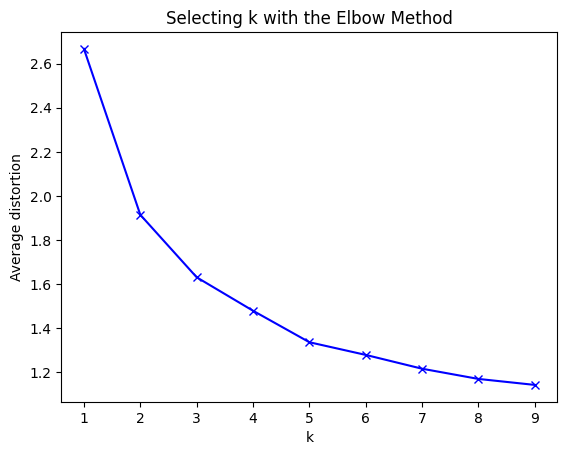

In [35]:
#Finding the best no of clusters

clusters=range(1,10)
meanDistortions=[]
score = []

for k in clusters:
    model=KMeans(n_clusters=k)
    model.fit(df_scaled)
    prediction=model.predict(df_scaled)
    meanDistortions.append(sum(np.min(cdist(df_scaled, model.cluster_centers_, 'euclidean'), axis=1)) / df_scaled.shape[0])
    label=model.labels_
    score.append(label)
    

plt.plot(clusters, meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.title('Selecting k with the Elbow Method')

In [36]:
for i in range(2,10):
  model=KMeans(n_clusters=i)
  model.fit(df_scaled)
  labels=model.labels_
  print("Score of ",i,"clusters",silhouette_score(df_scaled,labels))  #Finding the silhouette score

Score of  2 clusters 0.4148919831294719
Score of  3 clusters 0.3246673901601845
Score of  4 clusters 0.3123489662662654
Score of  5 clusters 0.33296973781495653
Score of  6 clusters 0.33652162036030914
Score of  7 clusters 0.2948026313873311
Score of  8 clusters 0.2891981619529679
Score of  9 clusters 0.2708075624042717


We can see an elbow around k=5 or k=6. Since the silhouette scorre is more for k=6 and then reduces, the final model has 6 clusters

In [37]:
model=KMeans(6)         #Kmeans model
model.fit(df_scaled)
prediction=model.predict(df_scaled)

In [38]:
df4=df3.copy(deep=True)
df1_scaled=df_scaled.copy(deep=True)

In [39]:
df4['GROUP']= prediction               #Making a column for labels after clustering
df1_scaled["GROUP"] = prediction
df4.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin,GROUP
0,18.0,8,307.0,130.0,3504,12.0,70,1,1
1,15.0,8,350.0,165.0,3693,11.5,70,1,1
2,18.0,8,318.0,150.0,3436,11.0,70,1,1
3,16.0,8,304.0,150.0,3433,12.0,70,1,1
4,17.0,8,302.0,140.0,3449,10.5,70,1,1


In [40]:
df1_scaled.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin,GROUP
0,-0.706439,1.498191,1.090604,0.673118,0.630870,-1.295498,-1.627426,-0.715145,1
1,-1.090751,1.498191,1.503514,1.589958,0.854333,-1.477038,-1.627426,-0.715145,1
2,-0.706439,1.498191,1.196232,1.197027,0.550470,-1.658577,-1.627426,-0.715145,1
3,-0.962647,1.498191,1.061796,1.197027,0.546923,-1.295498,-1.627426,-0.715145,1
4,-0.834543,1.498191,1.042591,0.935072,0.565841,-1.840117,-1.627426,-0.715145,1


In [41]:
df5 = df4.groupby(['GROUP'])
df5.mean()

,mpg,cyl,disp,hp,wt,acc,yr,origin
GROUP,,,,,,,,
0,24.963077,4.138462,110.046154,92.015385,2398.907692,14.924615,74.538462,2.492308
1,14.429787,8.000000,350.042553,162.393617,4157.978723,12.576596,73.468085,1.000000
2,19.181707,6.207317,232.829268,101.579268,3301.402439,16.674390,75.743902,1.048780
3,29.159649,4.175439,132.719298,84.719298,2521.578947,15.870175,80.000000,1.000000
4,24.566667,4.000000,111.893939,74.863636,2325.030303,18.657576,72.787879,1.393939
5,34.837313,4.044776,98.164179,69.223881,2153.417910,17.256716,79.522388,2.701493


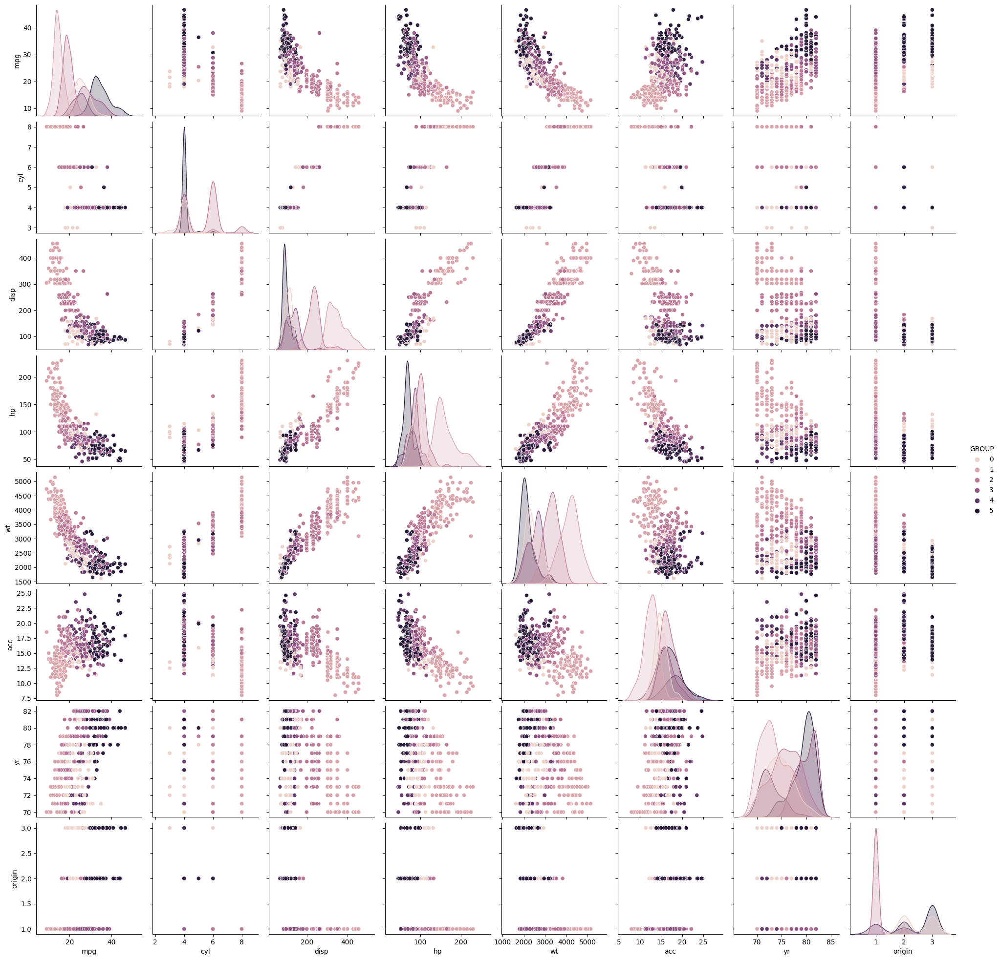

In [42]:
sns.pairplot(data=df4, diag_kind='kde',hue='GROUP');

##Hierarchical clustering

In [43]:
model = AgglomerativeClustering(n_clusters=6, affinity='euclidean',  linkage='average')
model.fit(df_scaled)
labels = model.labels_

In [44]:
df6=df3.copy(deep=True)

In [45]:
df6['labels'] = labels
df6.head(5)

,mpg,cyl,disp,hp,wt,acc,yr,origin,labels
0,18.0,8,307.0,130.0,3504,12.0,70,1,3
1,15.0,8,350.0,165.0,3693,11.5,70,1,3
2,18.0,8,318.0,150.0,3436,11.0,70,1,3
3,16.0,8,304.0,150.0,3433,12.0,70,1,3
4,17.0,8,302.0,140.0,3449,10.5,70,1,3


In [46]:
df6 = df6.groupby(['labels'])
df6.mean()

,mpg,cyl,disp,hp,wt,acc,yr,origin
labels,,,,,,,,
0,26.517687,4.061224,118.173469,84.751701,2404.870748,15.999320,76.258503,1.619048
1,33.781818,4.363636,124.000000,65.636364,2828.636364,21.818182,79.636364,2.000000
2,19.208451,6.112676,232.957746,98.415493,3277.098592,16.878873,75.352113,1.000000
3,14.684000,7.980000,345.470000,160.400000,4121.560000,12.702000,73.740000,1.000000
4,21.444444,6.000000,159.333333,119.222222,3073.555556,14.155556,77.777778,2.666667
5,34.398333,4.000000,95.450000,70.533333,2085.100000,16.803333,79.033333,2.850000


In [47]:
Z_average = linkage(df_scaled, metric='euclidean', method='average')      #Finding the cophenet correlation coefficient
c, coph_dists = cophenet(Z_average , pdist(df_scaled))

print(c)

0.7554096381782244


In [48]:
Z_average = linkage(df_scaled, metric='euclidean', method='complete')
c, coph_dists = cophenet(Z_average , pdist(df_scaled))

print(c)

0.723784736927783


In [49]:
Z_average = linkage(df_scaled, metric='euclidean', method='ward')
c, coph_dists = cophenet(Z_average , pdist(df_scaled))

print(c)

0.681505889742128


##PartB

In [50]:
dfa=pd.read_csv('/content/MyDrive/MyDrive/Dataset/vehicle.csv')    #Reading the datset

In [51]:
dfa.head() #First 5 datapoints

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [52]:
dfa.shape     #no of rows and columns in the dataset

(846, 19)

In [53]:
dfa.info()       

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 13  scaled_radius_of_gyr

In [54]:
dfa.isnull().sum()        #Check for null values

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

In [55]:
dfa['class'].unique()

array(['van', 'car', 'bus'], dtype=object)

In [56]:
dfa['class']=dfa['class'].replace({'van':1,'car':2,'bus':3})

In [57]:
median_filler= lambda x: x.fillna(x.median())      #imputing the missing values
dfa=dfa.apply(median_filler,axis=0) 

In [58]:
dfa.describe().T        #Statistical summary

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.00,119.0
circularity,846.0,44.823877,6.134272,33.0,40.00,44.0,49.00,59.0
distance_circularity,846.0,82.100473,15.741569,40.0,70.00,80.0,98.00,112.0
radius_ratio,846.0,168.874704,33.401356,104.0,141.00,167.0,195.00,333.0
pr.axis_aspect_ratio,846.0,61.677305,7.882188,47.0,57.00,61.0,65.00,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.00,55.0
scatter_ratio,846.0,168.887707,33.197710,112.0,147.00,157.0,198.00,265.0
elongatedness,846.0,40.936170,7.811882,26.0,33.00,43.0,46.00,61.0
pr.axis_rectangularity,846.0,20.580378,2.588558,17.0,19.00,20.0,23.00,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.00,188.0


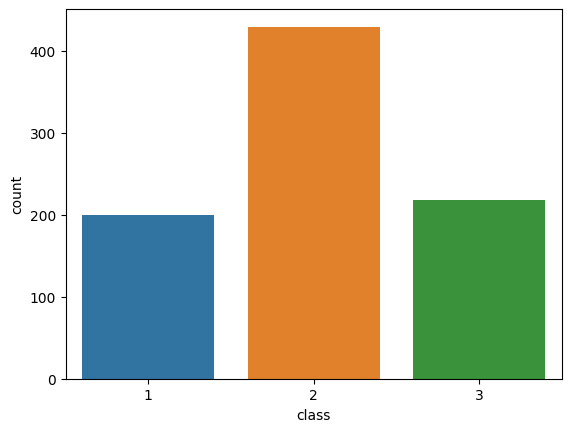

In [59]:
sns.countplot(data=dfa,x='class');

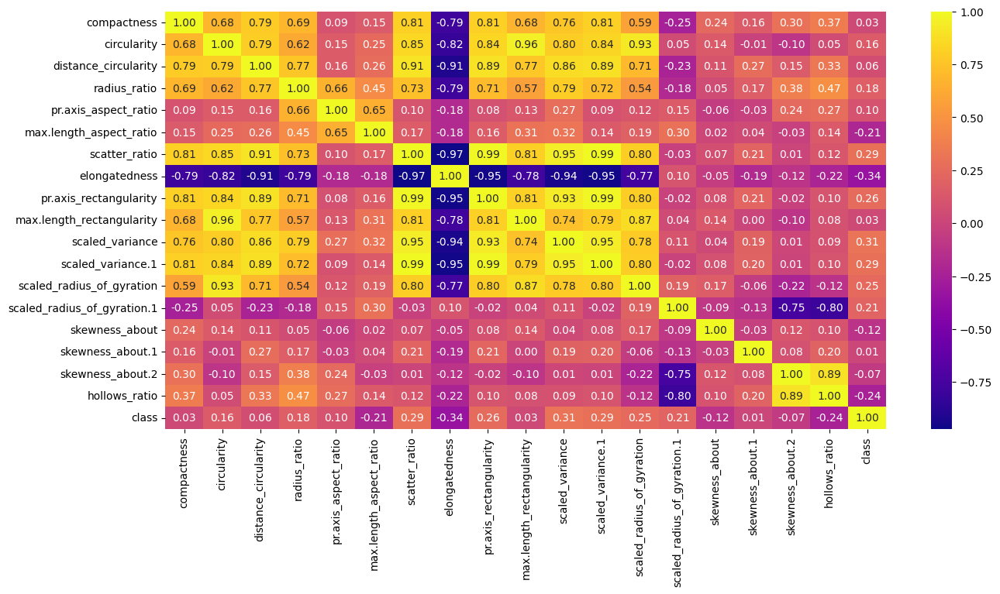

In [60]:
plt.figure(figsize = (15,7))
sns.heatmap(dfa.corr(), cmap='plasma',annot=True, fmt='.2f'); 

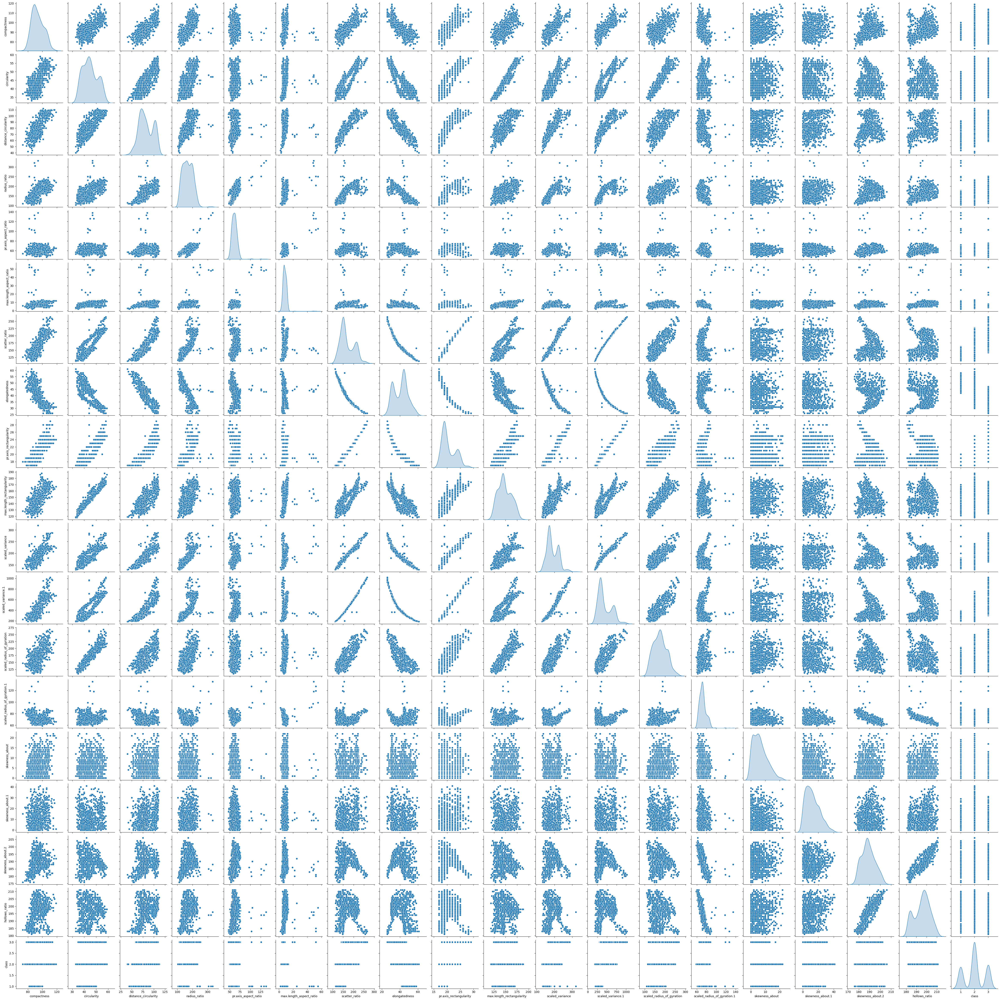

In [61]:
sns.pairplot(dfa, diag_kind='kde');

Text(0.5, 1.0, 'elongatedness')

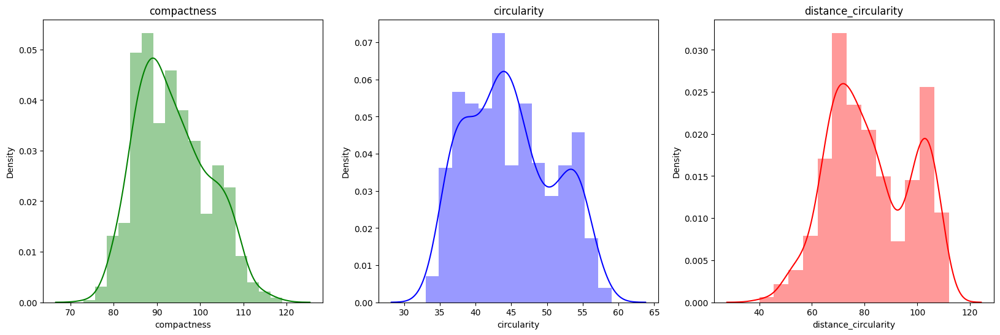

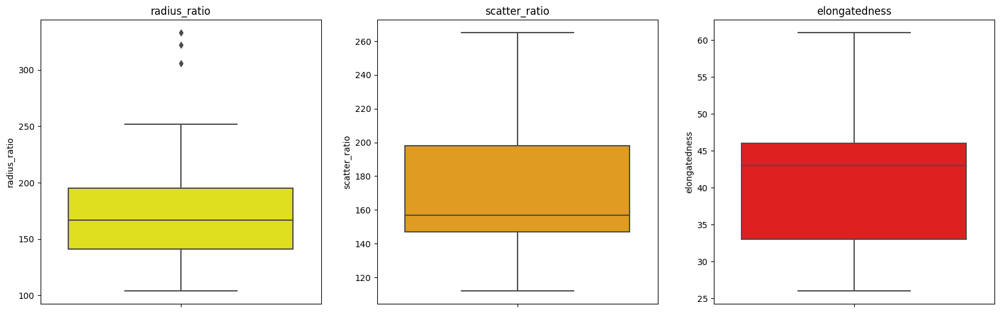

In [62]:
plt.figure(figsize=(20,6));

plt.subplot(1,3,1);
sns.distplot(dfa['compactness'],color='green');
plt.title('compactness')

plt.subplot(1,3,2);
sns.distplot(dfa['circularity'],color='blue');
plt.title('circularity')

plt.subplot(1,3,3);
sns.distplot(dfa['distance_circularity'],color='red');
plt.title('distance_circularity')

plt.figure(figsize=(20,6));

plt.subplot(1,3,1);
sns.boxplot(y=dfa['radius_ratio'],color='yellow');
plt.title('radius_ratio')

plt.subplot(1,3,2);
sns.boxplot(y=dfa['scatter_ratio'],color='orange');
plt.title('scatter_ratio')

plt.subplot(1,3,3);
sns.boxplot(y=dfa['elongatedness'],color='red');
plt.title('elongatedness')

The plots shows the distribution of various features of the dataset.

Text(0.5, 1.0, 'distance_circularity')

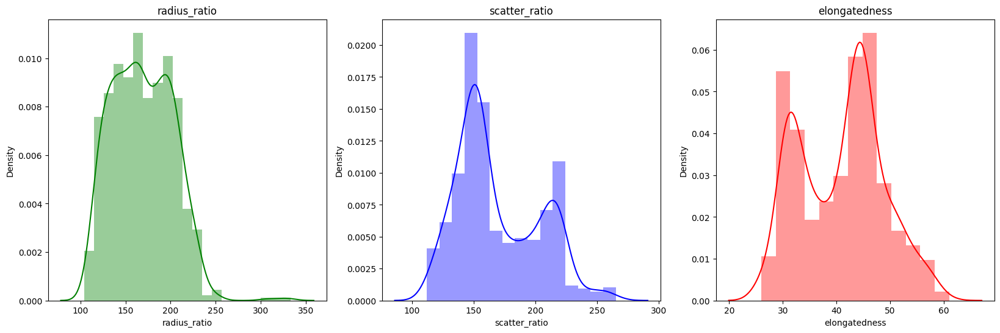

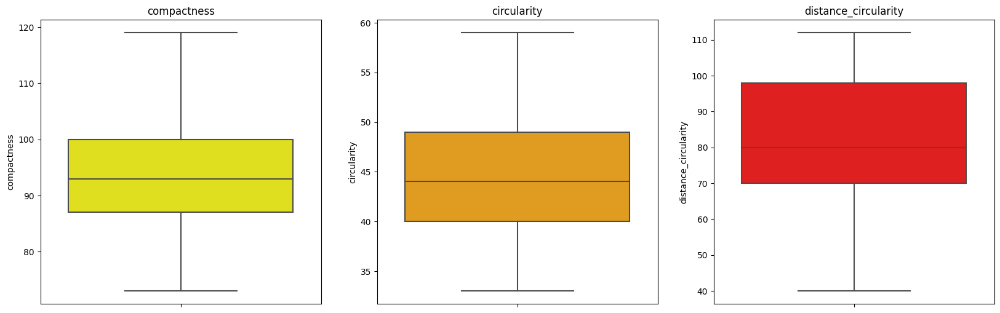

In [63]:
plt.figure(figsize=(20,6));

plt.subplot(1,3,1);
sns.distplot(dfa['radius_ratio'],color='green');
plt.title('radius_ratio')

plt.subplot(1,3,2);
sns.distplot(dfa['scatter_ratio'],color='blue');
plt.title('scatter_ratio')

plt.subplot(1,3,3);
sns.distplot(dfa['elongatedness'],color='red');
plt.title('elongatedness')

plt.figure(figsize=(20,6));

plt.subplot(1,3,1);
sns.boxplot(y=dfa['compactness'],color='yellow');
plt.title('compactness')

plt.subplot(1,3,2);
sns.boxplot(y=dfa['circularity'],color='orange');
plt.title('circularity')

plt.subplot(1,3,3);
sns.boxplot(y=dfa['distance_circularity'],color='red');
plt.title('distance_circularity')

The plots shows the distribution of various features of the dataset

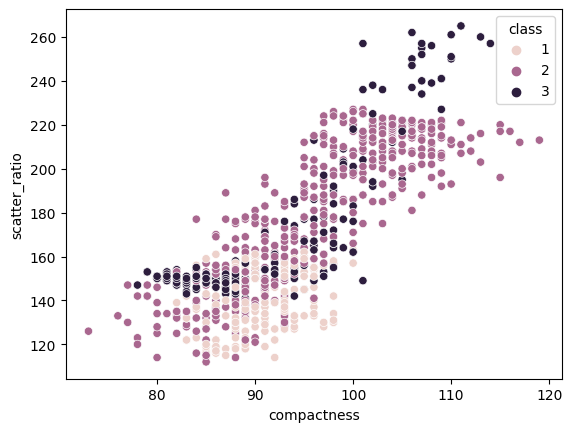

In [64]:
sns.scatterplot(data=dfa,x='compactness',y='scatter_ratio',hue=dfa['class']);

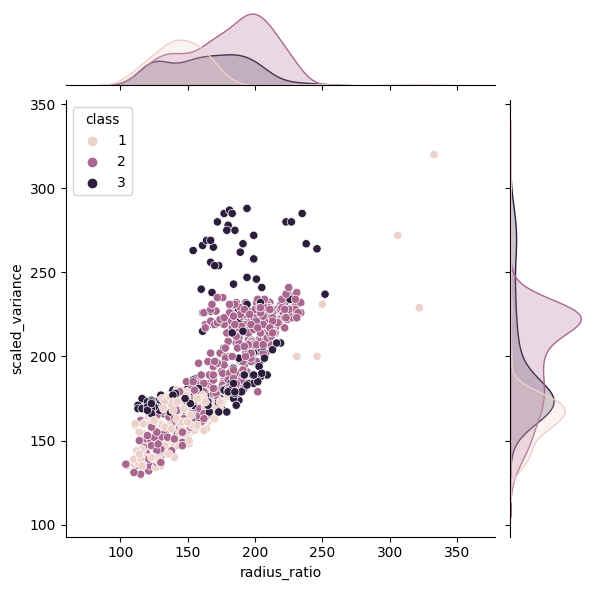

In [65]:
sns.jointplot(data=dfa,x='radius_ratio',y='scaled_variance',hue=dfa['class']);

Text(0.5, 1.0, 'Class')

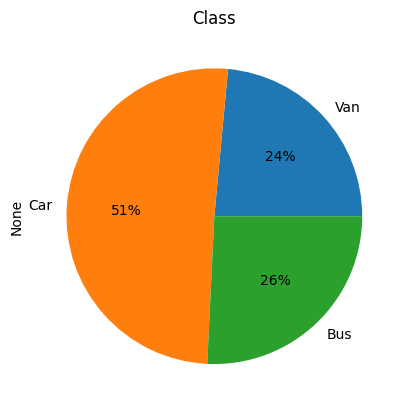

In [66]:
dfa.groupby('class').size().plot(kind='pie',autopct='%1.0f%%',labels=['Van','Car','Bus']); 
plt.title('Class')

In [67]:
dfa.columns

Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio', 'class'],
      dtype='object')

##SVM without PCA

In [68]:
x=dfa.drop('class',axis=1)
y=dfa['class']

In [69]:
x=x.apply(zscore) #Standardize the data

In [70]:
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.30, random_state=1)  #Split the data into train and test data of 70:30 ratio
print('X Train set contains {} data'.format(x_train.shape))
print('X Test set contains {} data'.format(x_test.shape))
print('Y Train set contains {} data'.format(y_train.shape))
print('Y Test set contains {} data'.format(y_test.shape))

X Train set contains (592, 18) data
X Test set contains (254, 18) data
Y Train set contains (592,) data
Y Test set contains (254,) data


In [71]:
svm_model = svm.SVC(gamma = 0.025,C=3)
svm_model.fit(x_train,y_train)
svm_y_pred = svm_model.predict(x_test)

In [72]:
print('Accuracy score for SVM Model is {}'.format(accuracy_score(y_test,svm_y_pred)))

Accuracy score for SVM Model is 0.9566929133858267


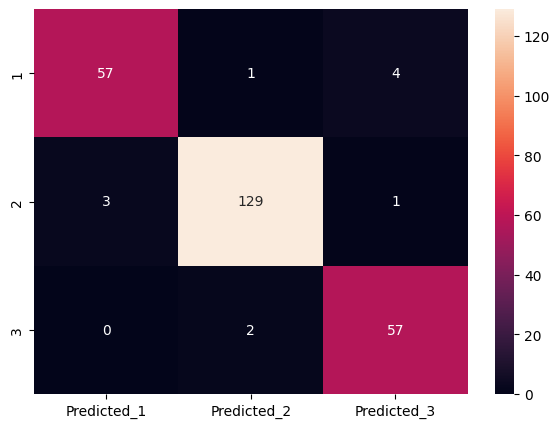

In [73]:
cm = confusion_matrix(y_test,svm_y_pred)
cm_df = pd.DataFrame(cm, index= [i for i in ['1','2','3']],columns= [i for i in ['Predicted_1','Predicted_2','Predicted_3']])
plt.figure(figsize=(7,5))
sns.heatmap(cm_df,annot=True,fmt='g');

##PCA

In [74]:
covMatrix = np.cov(x,rowvar=False)
print(covMatrix)

[[ 1.00118343  0.68569786  0.79086299  0.69055952  0.09164265  0.14842463
   0.81358214 -0.78968322  0.81465658  0.67694334  0.76297234  0.81497566
   0.58593517 -0.24988794  0.23635777  0.15720044  0.29889034  0.36598446]
 [ 0.68569786  1.00118343  0.79325751  0.6216467   0.15396023  0.25176438
   0.8489411  -0.82244387  0.84439802  0.96245572  0.79724837  0.83693508
   0.92691166  0.05200785  0.14436828 -0.01145212 -0.10455005  0.04640562]
 [ 0.79086299  0.79325751  1.00118343  0.76794246  0.15864319  0.26499957
   0.90614687 -0.9123854   0.89408198  0.77544391  0.86253904  0.88706577
   0.70660663 -0.22621115  0.1140589   0.26586088  0.14627113  0.33312625]
 [ 0.69055952  0.6216467   0.76794246  1.00118343  0.66423242  0.45058426
   0.73529816 -0.79041561  0.70922371  0.56962256  0.79435372  0.71928618
   0.53700678 -0.18061084  0.04877032  0.17394649  0.38266622  0.47186659]
 [ 0.09164265  0.15396023  0.15864319  0.66423242  1.00118343  0.64949139
   0.10385472 -0.18325156  0.07969

In [75]:
pca = PCA(n_components=18)
pca.fit(x)

PCA(n_components=18)

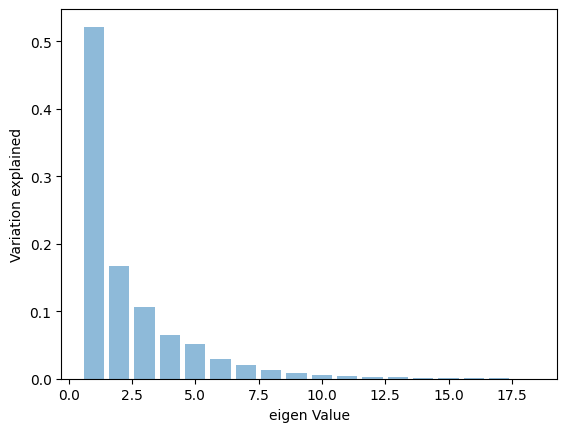

In [76]:
plt.bar(list(range(1,19)),pca.explained_variance_ratio_,alpha=0.5, align='center')
plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.show()

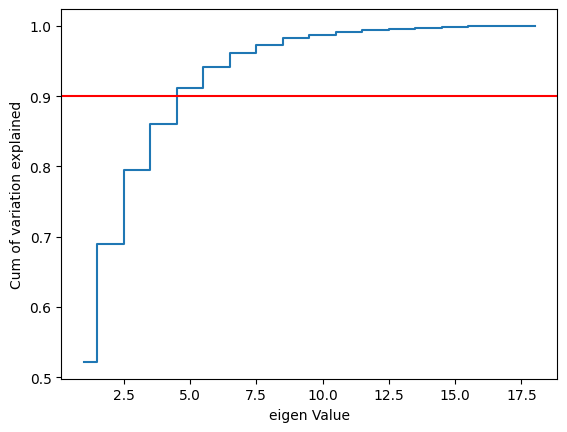

In [77]:
plt.step(list(range(1,19)),np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.axhline(y=0.9,color='red')
plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.show()

In [78]:
pca3 = PCA(n_components=10)
pca3.fit(x)
print(pca3.components_)
print(pca3.explained_variance_ratio_)
xpca = pca3.transform(x)

[[ 2.75283688e-01  2.93258469e-01  3.04609128e-01  2.67606877e-01
   8.05039890e-02  9.72756855e-02  3.17092750e-01 -3.14133155e-01
   3.13959064e-01  2.82830900e-01  3.09280359e-01  3.13788457e-01
   2.72047492e-01 -2.08137692e-02  4.14555082e-02  5.82250207e-02
   3.02795063e-02  7.41453913e-02]
 [-1.26953763e-01  1.25576727e-01 -7.29516436e-02 -1.89634378e-01
  -1.22174860e-01  1.07482875e-02  4.81181371e-02  1.27498515e-02
   5.99352482e-02  1.16220532e-01  6.22806229e-02  5.37843596e-02
   2.09233172e-01  4.88525148e-01 -5.50899716e-02 -1.24085090e-01
  -5.40914775e-01 -5.40354258e-01]
 [-1.19922479e-01 -2.48205467e-02 -5.60143254e-02  2.75074211e-01
   6.42012966e-01  5.91801304e-01 -9.76283108e-02  5.76484384e-02
  -1.09512416e-01 -1.70641987e-02  5.63239801e-02 -1.08840729e-01
  -3.14636493e-02  2.86277015e-01 -1.15679354e-01 -7.52828901e-02
   8.73592034e-03  3.95242743e-02]
 [ 7.83843562e-02  1.87337408e-01 -7.12008427e-02 -4.26053415e-02
   3.27257119e-02  3.14147277e-02 -9.

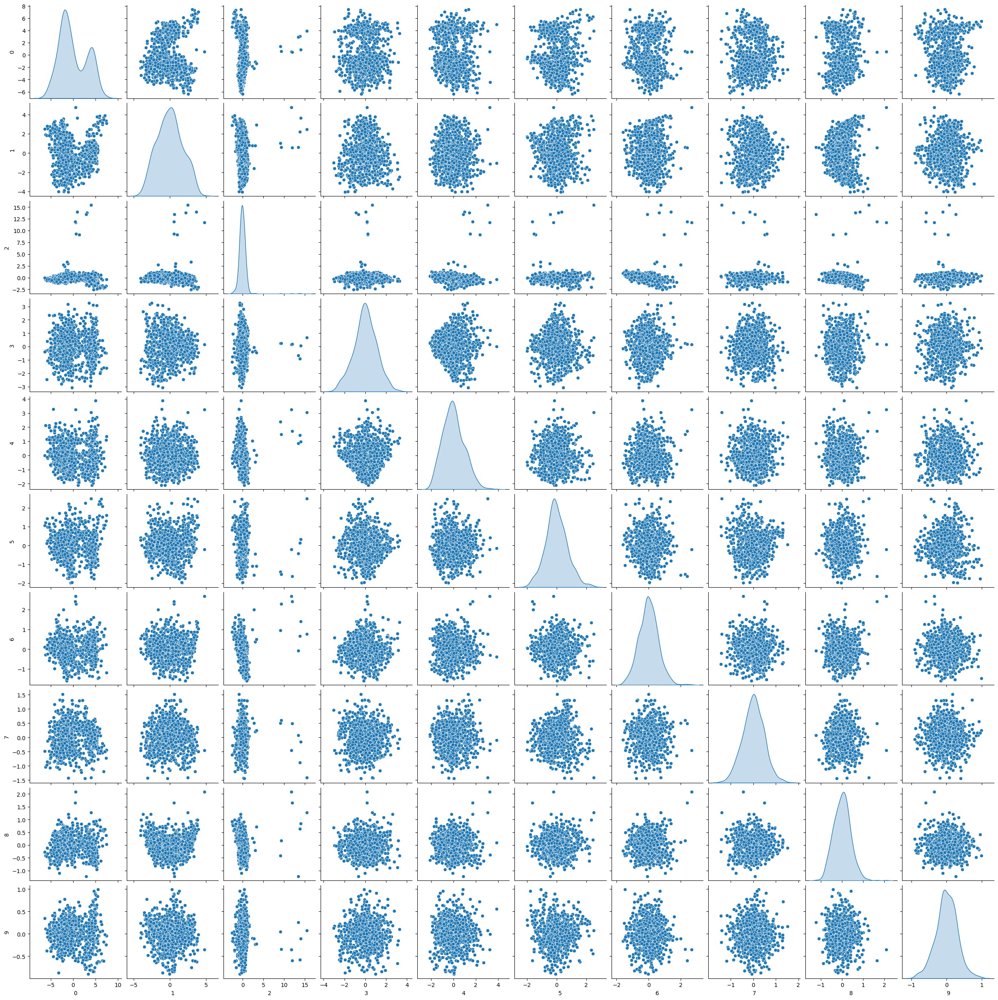

In [79]:
sns.pairplot(pd.DataFrame(xpca),diag_kind='kde');

We can see there is no correlation between the variables on using PCA.

##SVM with PCA

In [80]:
x_train, x_test, y_train, y_test = train_test_split(xpca,y, test_size=0.30, random_state=1)  #Split the data into train and test data of 70:30 ratio
print('X Train set contains {} data'.format(x_train.shape))
print('X Test set contains {} data'.format(x_test.shape))
print('Y Train set contains {} data'.format(y_train.shape))
print('Y Test set contains {} data'.format(y_test.shape))

X Train set contains (592, 10) data
X Test set contains (254, 10) data
Y Train set contains (592,) data
Y Test set contains (254,) data


In [81]:
svm_model = svm.SVC(gamma = 0.025,C=3)
svm_model.fit(x_train,y_train)
svm_y_pred = svm_model.predict(x_test)

In [82]:
print('Accuracy score for SVM Model is {}'.format(accuracy_score(y_test,svm_y_pred)))

Accuracy score for SVM Model is 0.952755905511811


In [83]:
print(classification_report(y_test, svm_y_pred))

              precision    recall  f1-score   support

           1       0.93      0.90      0.92        62
           2       0.98      0.97      0.97       133
           3       0.92      0.97      0.94        59

    accuracy                           0.95       254
   macro avg       0.94      0.95      0.94       254
weighted avg       0.95      0.95      0.95       254



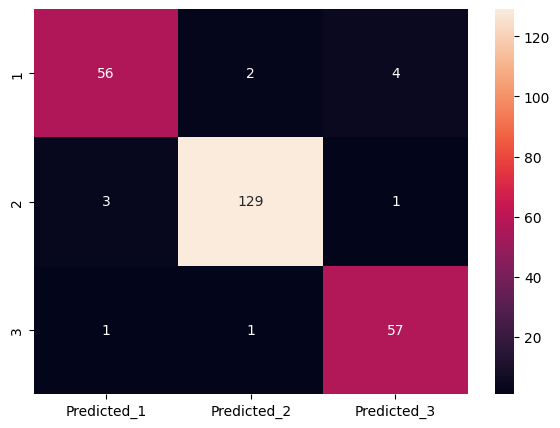

In [84]:
cm = confusion_matrix(y_test,svm_y_pred)
cm_df = pd.DataFrame(cm, index= [i for i in ['1','2','3']],columns= [i for i in ['Predicted_1','Predicted_2','Predicted_3']])
plt.figure(figsize=(7,5))
sns.heatmap(cm_df,annot=True,fmt='g');

In [85]:
from sklearn.model_selection import GridSearchCV

param_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']}

grid = GridSearchCV(svm.SVC(),param_grid,refit= True, verbose =0)

grid.fit(x_train,y_train)

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']})

In [86]:
print(grid.best_params_)
print(grid.best_estimator_)

{'C': 100, 'gamma': 0.1, 'kernel': 'rbf'}
SVC(C=100, gamma=0.1)


In [87]:
grid_y_pred = grid.predict(x_test)
print('Accuracy score for SVM Model is %1.2f'%accuracy_score(y_test,grid_y_pred))

Accuracy score for SVM Model is 0.93


A few of the assumptions in PCA are:
1. It assumes the variables or features have a linear relationship with each other.
2. The principal component that explains most of the variance is given more importance compared to other principal components.
3. The more no of outliers can affect the results of PCA  model. So it assumes there are a few or no outliers in the dataset.
4. There must be a higher correlation among the variables and upon using PCA the reduced features can explain most off the variance in the original dataset.

Advantages of using PCA:
1. It helps in removing the multi-collinearity and improves the model performance.
2. It helps avoid overfitting the data by capturing the information and removing noise.
3. It helps in reducing the computational time, storage requirements by reducing the curse of dimensionality.
4. It makes visualization of data more easier.

Limitations of using PCA:
1. After the implimentation of PCA, the independant variables are turned into principal components which becomes less interpretable compared to the original features.
2. It is important to standardize the data before using PCA else it will not be able to give the proper results.